In [1]:
from IPython.display import display, Audio

from asteroid.models import BaseModel
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import torch


def show_magspec(waveform, **kw):
    return librosa.display.specshow(
        librosa.amplitude_to_db(np.abs(librosa.stft(waveform))),
        y_axis="log", x_axis="time",
        **kw
    )

In [2]:
model = BaseModel.from_pretrained("/home/kjc/asteroid/egs/mimii_single/X-UMX/outputs/best_model.pth")
model._return_time_signals = True

In [3]:
fan_raw, sr = sf.read("/home/kjc/mimii/6dB/slider/id_00/normal/00000000.wav", dtype="float32")
fan = fan_raw.transpose().reshape(1, 8, 160000)

pump_raw, _ = sf.read("/home/kjc/mimii/6dB/slider/id_02/normal/00000000.wav", dtype="float32")
pump = pump_raw.transpose().reshape(1, 8, 160000)

slider_raw, _ = sf.read("/home/kjc/mimii/6dB/slider/id_04/normal/00000000.wav", dtype="float32")
slider = slider_raw.transpose().reshape(1, 8, 160000)

valve_raw, _ = sf.read("/home/kjc/mimii/6dB/slider/id_06/normal/00000000.wav", dtype="float32")
valve = valve_raw.transpose().reshape(1, 8, 160000)

mixture = fan[:, 0:2, :] + pump[:, 2:4, :] + slider[:, 4:6, :] + valve[:, 6:8, :]


In [4]:
masked_mixture, time_signal = model(torch.Tensor(mixture[:, :2, :]))

/home/kjc/.conda/envs/mtp/lib/python3.8/site-packages/torch/functional.py:647: UserWarning: istft will require a complex-valued input tensor in a future PyTorch release. Matching the output from stft with return_complex=True.  (Triggered internally at  /opt/conda/conda-bld/pytorch_1639180588308/work/aten/src/ATen/native/SpectralOps.cpp:811.)
  return _VF.istft(input, n_fft, hop_length, win_length, window, center,  # type: ignore[attr-defined]


In [5]:
print(masked_mixture.shape)
print(time_signal.shape)

print((masked_mixture[0]).norm())
# print((masked_mixture[0]-masked_mixture[1]).norm())
# print((masked_mixture[0]-masked_mixture[2]).norm())
# print((masked_mixture[0]-masked_mixture[3]).norm())
# print((masked_mixture[1]-masked_mixture[2]).norm())

torch.Size([4, 157, 1, 2, 2049])
torch.Size([4, 1, 2, 159744])
tensor(91.0013, grad_fn=<CopyBackwards>)


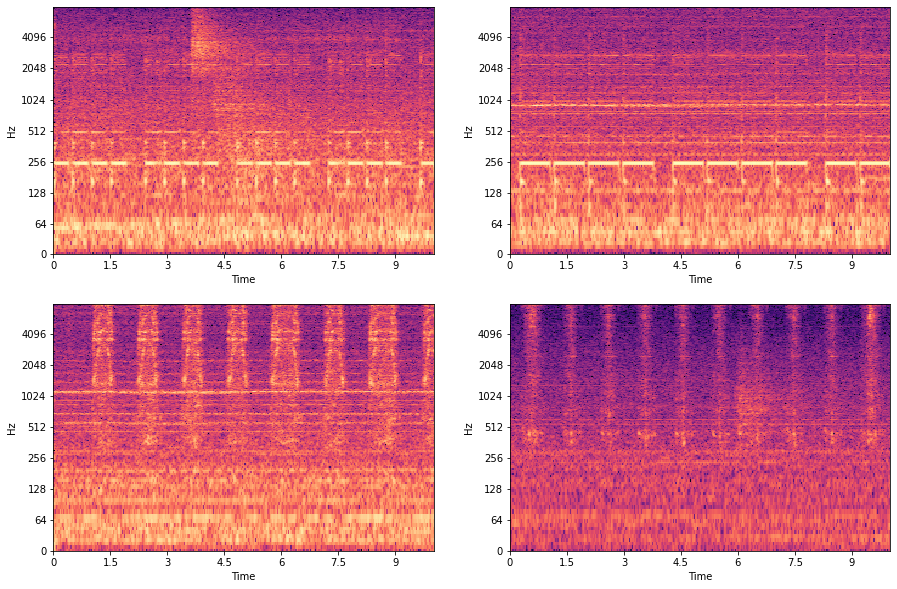

In [6]:

fig, ax = plt.subplots(2, 2, figsize=(15, 10))
show_magspec(fan[0, 0, :], sr=16000, ax=ax[0][0])
show_magspec(pump[0, 0, :], sr=16000, ax=ax[0][1])
show_magspec(slider[0, 0, :], sr=16000, ax=ax[1][0])
show_magspec(valve[0, 0, :], sr=16000, ax=ax[1][1])

display(Audio(fan[0, :, :], rate=16000))
display(Audio(pump[0, :, :], rate=16000))
display(Audio(slider[0, :, :], rate=16000))
display(Audio(valve[0, :, :], rate=16000))

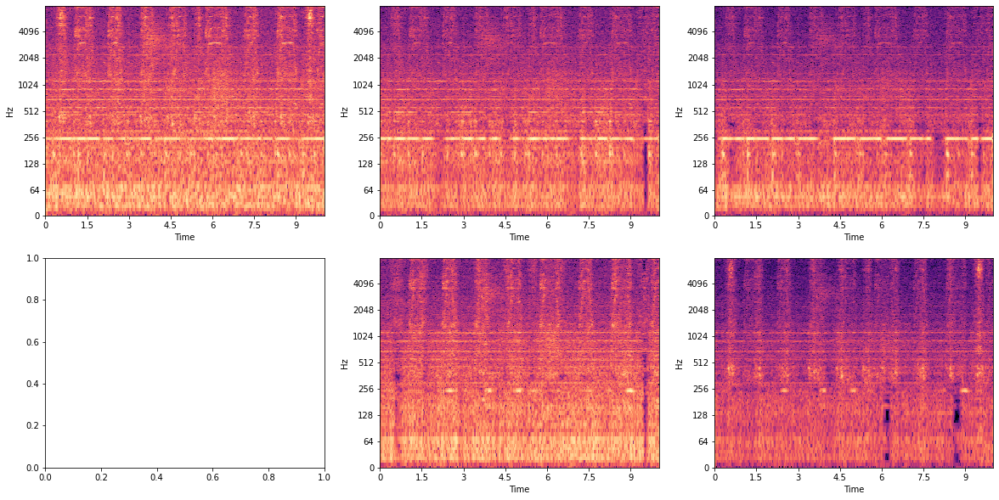

In [9]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
show_magspec(mixture[0, 0, :], sr=16000, ax=ax[0][0])
show_magspec(time_signal[0, 0, 0].detach().numpy(), sr=16000, ax=ax[0][1])
show_magspec(time_signal[1, 0, 0].detach().numpy(), sr=16000, ax=ax[0][2])
show_magspec(time_signal[2, 0, 0].detach().numpy(), sr=16000, ax=ax[1][1])
show_magspec(time_signal[3, 0, 0].detach().numpy(), sr=16000, ax=ax[1][2])


display(Audio(mixture[0, :, :], rate=16000))
display(Audio(time_signal[0, :, 0].detach().numpy(), rate=16000))
display(Audio(time_signal[1, :, 0].detach().numpy(), rate=16000))
display(Audio(time_signal[2, :, 0].detach().numpy(), rate=16000))
display(Audio(time_signal[3, :, 0].detach().numpy(), rate=16000))

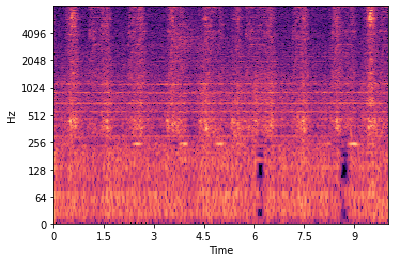

In [20]:

show_magspec(time_signal[3, 0, 0].detach().numpy(), sr=16000)

# show_magspec(mixture[0, 0, :], sr=16000, ax=ax[0][0])
# show_magspec(time_signal[0, 0, 0].detach().numpy(), sr=16000, ax=ax[0][1])
# show_magspec(time_signal[1, 0, 0].detach().numpy(), sr=16000, ax=ax[0][2])
# show_magspec(time_signal[2, 0, 0].detach().numpy(), sr=16000, ax=ax[1][1])
# show_magspec(time_signal[3, 0, 0].detach().numpy(), sr=16000, ax=ax[1][2])